# The following scrips are use for plotting and visualizing data

In [1]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the root directories
root_dirs = [
    "/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait",  # Replace with your root directory paths
    "/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait_illuminant_correction/exposure_correction",
    "/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait_illuminant_correction/color_correction",
    "/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait_illuminant_correction/exposure_color_correction",
    "/home/dasec-notebook/Thesis/Datasets/mst-e_data/CSEC"
]

# Function to get all image paths from a folder of folders structure
def get_all_image_paths(root_dir):
    image_paths = []
    for subdir, _, files in os.walk(root_dir):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.webp', '.JPG')):
                image_paths.append(os.path.join(subdir, file))
    return sorted(image_paths)  

# Get all image paths from the first root directory (used for reference)
reference_image_paths = get_all_image_paths(root_dirs[0])

# Select 15 random images from the reference directory
random_images = random.sample(reference_image_paths, 15)


print(random_images)


['/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait/subject_6/PXL_20220922_141737535.PORTRAIT.jpg', '/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait/subject_9/PXL_20220922_135610252.jpg', '/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait/subject_15/PXL_20220922_131732383.jpg', '/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait/subject_12/PXL_20220922_175157945.jpg', '/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait/subject_0/PXL_20220922_134119737.jpg', '/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait/subject_1/PXL_20220922_174552943.jpg', '/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait/subject_1/PXL_20220922_174018423.jpg', '/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait/subject_5/PXL_20220922_142921035.jpg', '/home/dasec-notebook/Thesis/Datasets/mst-e_data/mst-e_data_portrait/subject_3/PXL_20220922_193503938.jpg', '/home/dasec-not

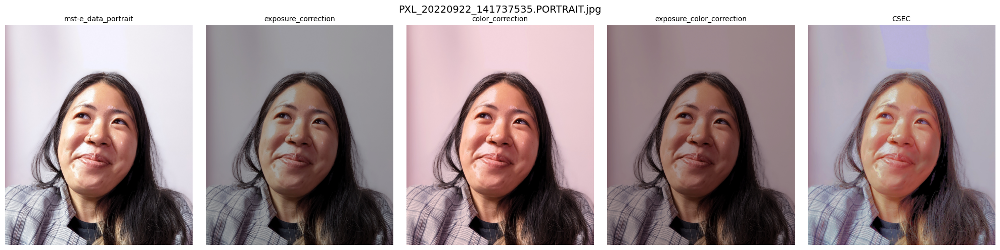

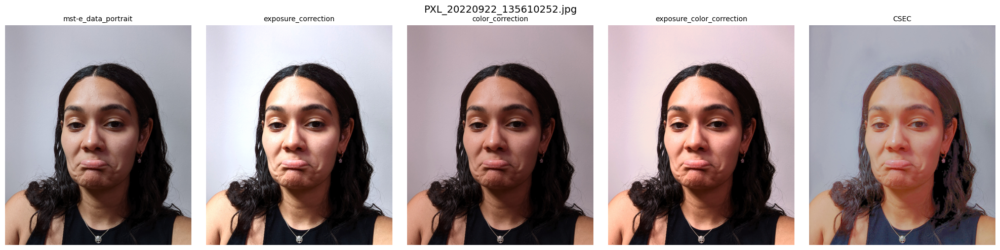

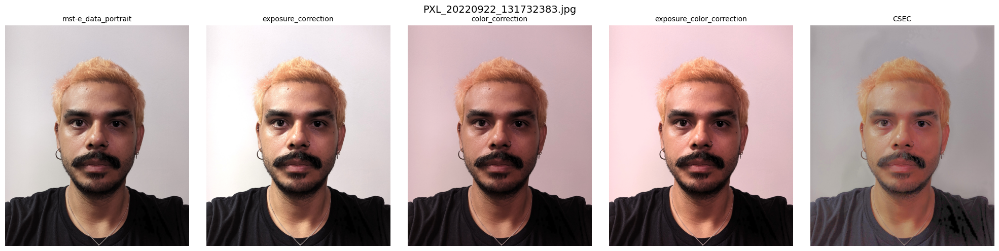

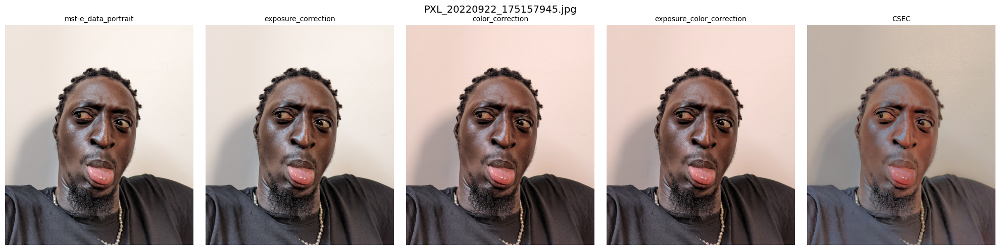

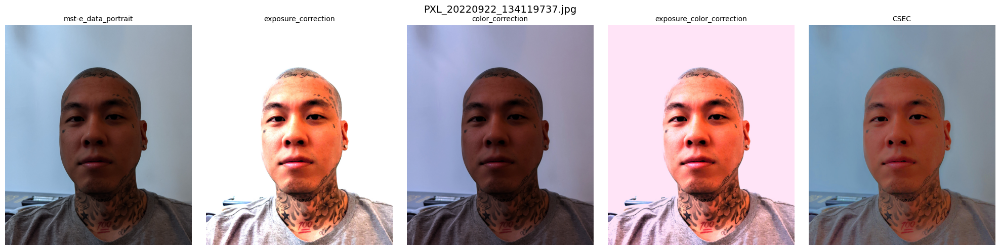

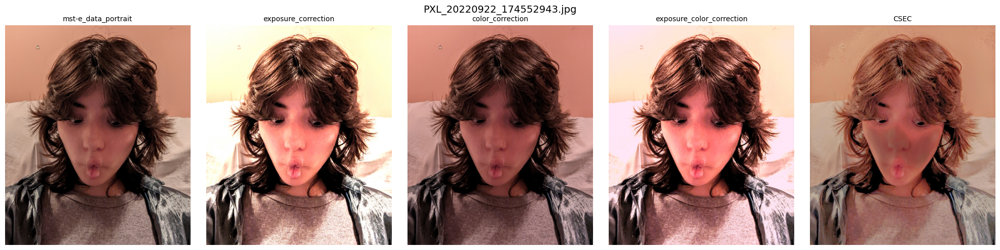

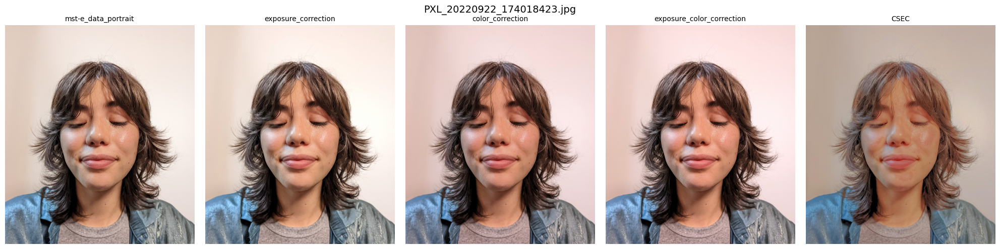

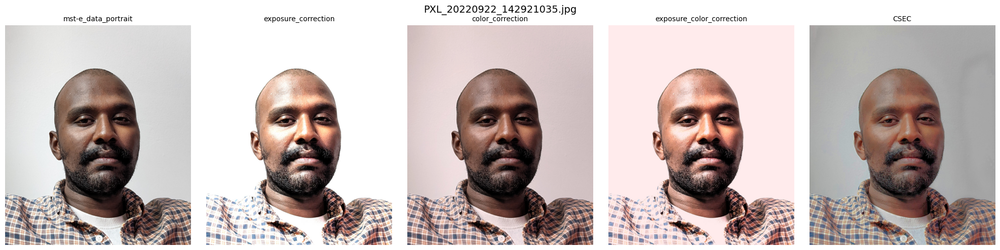

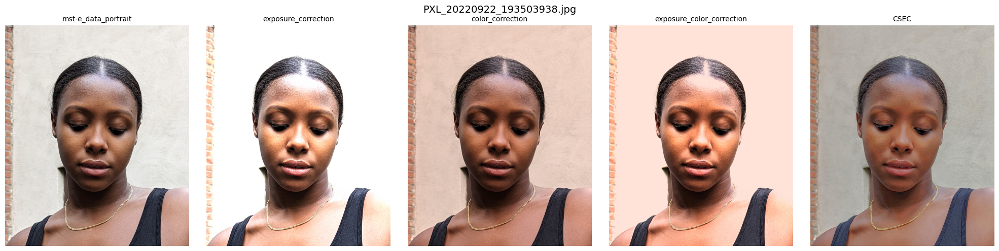

In [2]:
# Plot the selected images for each reference image
for i, ref_image_path in enumerate(random_images):
    image_name = os.path.basename(ref_image_path) 

    fig, axes = plt.subplots(1, len(root_dirs), figsize=(20, 5))  
    for j, root_dir in enumerate(root_dirs):
        current_image_path = os.path.join(root_dir, *ref_image_path.split(os.sep)[-2:])

        # Read and process the image
        image = cv2.imread(current_image_path)
        if image is None:
            raise ValueError(f"Image not found at {current_image_path}")
            continue

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for Matplotlib

        # Add the image to the subplot
        axes[j].imshow(image)
        axes[j].axis('off')  # Turn off axis lines

        image_title = os.path.basename(root_dir)
        axes[j].set_title(image_title, fontsize=10)

    fig.suptitle(image_name, fontsize=14)  

    plt.tight_layout()
    plt.show()
